In [49]:
import stlearn as st
st.settings.set_figure_params(dpi=300)
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import sys
file = Path("../stimage").resolve()
parent= file.parent
sys.path.append(str(parent))
from stimage.utils import gene_plot, Read10X, ReadOldST
from stimage.model import negative_binomial_layer, negative_binomial_loss, CNN_NB_model

In [2]:
BASE_PATH = Path("/clusterdata/uqxtan9/Xiao/STimage/dataset/breast_cancer_10x_visium")
TILE_PATH = BASE_PATH / "tiles"
TILE_PATH.mkdir(parents=True, exist_ok=True)

In [15]:
SAMPLE = "block1"
Sample1 = st.Read10X(BASE_PATH / SAMPLE, 
                  library_id=SAMPLE, 
                  count_file="V1_Breast_Cancer_Block_A_Section_1_filtered_feature_bc_matrix.h5",
                  quality="fulres",)
                  #source_image_path=BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif")
img = plt.imread(BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif", 0)
Sample1.uns["spatial"][SAMPLE]['images']["fulres"] = img

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [16]:
SAMPLE = "block2"
Sample2 = st.Read10X(BASE_PATH / SAMPLE, 
                  library_id=SAMPLE, 
                  count_file="V1_Breast_Cancer_Block_A_Section_2_filtered_feature_bc_matrix.h5",
                  quality="fulres",)
                  #source_image_path=BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif")
img = plt.imread(BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_2_image.tif", 0)
Sample2.uns["spatial"][SAMPLE]['images']["fulres"] = img

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [95]:
gene_list=["SLITRK6", "PGM5", "LINC00645", 
           "TTLL12", "COX6C", "CPB1",
           "KRT5", "MALAT1"]
gene = gene_list[2]

In [67]:
for adata in [
    Sample1,
    Sample2,
]:
#     count_df = adata.to_df()
#     count_df[count_df <=1] = 0
#     count_df[count_df >1] = 1
#     adata.X = count_df
#     adata[:,gene_list]
#     st.pp.filter_genes(adata,min_cells=1)
#     st.pp.normalize_total(adata)
#     st.pp.log1p(adata)
#     st.pp.scale(adata)

    # pre-processing for spot image
    TILE_PATH_ = TILE_PATH / list(adata.uns["spatial"].keys())[0]
    TILE_PATH_.mkdir(parents=True, exist_ok=True)
    st.pp.tiling(adata, TILE_PATH_, crop_size=299)
    st.pp.extract_feature(adata)

Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!


In [96]:
training_index = Sample1.obs.sample(frac=0.7, random_state=1).index
training_dataset = Sample1[training_index,].copy()

valid_index = Sample1.obs.index.isin(training_index)
valid_dataset = Sample1[~valid_index,].copy()

test_dataset = Sample2.copy()

In [97]:
train_X = training_dataset.obsm["X_tile_feature"]
# train_Y = scaler.fit_transform(training_dataset[:,gene].to_df())
train_Y = training_dataset[:,gene].to_df()

In [98]:
valid_X = valid_dataset.obsm["X_tile_feature"]
# valid_Y = scaler.fit_transform(valid_dataset[:,gene].to_df())
valid_Y = valid_dataset[:,gene].to_df()

In [99]:
test_X = test_dataset.obsm["X_tile_feature"]
# test_Y = scaler.fit_transform(test_dataset[:,gene].to_df())
test_Y = test_dataset[:,gene].to_df()

In [100]:
import pathlib

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.layers import Input, Dense, Lambda, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.losses import BinaryCrossentropy
print(tf.__version__)

2.4.0


In [101]:
model = CNN_NB_model()

In [102]:
EPOCHS = 500

history = model.fit(
  train_X, train_Y, batch_size=100,
  epochs=EPOCHS, validation_data = (valid_X, valid_Y), validation_batch_size = 100)

Epoch 1/500
27/27 [==============================] - 1s 10ms/step - loss: 1.8485 - negative_binomial_loss: 1.8485 - val_loss: 1.2797 - val_negative_binomial_loss: 1.2797
Epoch 2/500
27/27 [==============================] - 0s 4ms/step - loss: 1.5756 - negative_binomial_loss: 1.5756 - val_loss: 1.2256 - val_negative_binomial_loss: 1.2256
Epoch 3/500
27/27 [==============================] - 0s 4ms/step - loss: 1.4579 - negative_binomial_loss: 1.4579 - val_loss: 1.2123 - val_negative_binomial_loss: 1.2123
Epoch 4/500
27/27 [==============================] - 0s 3ms/step - loss: 1.4690 - negative_binomial_loss: 1.4690 - val_loss: 1.2017 - val_negative_binomial_loss: 1.2017
Epoch 5/500
27/27 [==============================] - 0s 4ms/step - loss: 1.4390 - negative_binomial_loss: 1.4390 - val_loss: 1.1981 - val_negative_binomial_loss: 1.1981
Epoch 6/500
27/27 [==============================] - 0s 4ms/step - loss: 1.4125 - negative_binomial_loss: 1.4125 - val_loss: 1.1851 - val_negative_binomia

27/27 [==============================] - 0s 3ms/step - loss: 1.1751 - negative_binomial_loss: 1.1751 - val_loss: 1.0800 - val_negative_binomial_loss: 1.0800
Epoch 50/500
27/27 [==============================] - 0s 4ms/step - loss: 1.1622 - negative_binomial_loss: 1.1622 - val_loss: 1.0720 - val_negative_binomial_loss: 1.0720
Epoch 51/500
27/27 [==============================] - 0s 3ms/step - loss: 1.1461 - negative_binomial_loss: 1.1461 - val_loss: 1.0771 - val_negative_binomial_loss: 1.0771
Epoch 52/500
27/27 [==============================] - 0s 3ms/step - loss: 1.2006 - negative_binomial_loss: 1.2006 - val_loss: 1.0706 - val_negative_binomial_loss: 1.0706
Epoch 53/500
27/27 [==============================] - 0s 3ms/step - loss: 1.1840 - negative_binomial_loss: 1.1840 - val_loss: 1.0704 - val_negative_binomial_loss: 1.0704
Epoch 54/500
27/27 [==============================] - 0s 3ms/step - loss: 1.1137 - negative_binomial_loss: 1.1137 - val_loss: 1.0709 - val_negative_binomial_loss: 

27/27 [==============================] - 0s 3ms/step - loss: 1.0926 - negative_binomial_loss: 1.0926 - val_loss: 1.0540 - val_negative_binomial_loss: 1.0540
Epoch 98/500
27/27 [==============================] - 0s 3ms/step - loss: 1.1044 - negative_binomial_loss: 1.1044 - val_loss: 1.0534 - val_negative_binomial_loss: 1.0534
Epoch 99/500
27/27 [==============================] - 0s 4ms/step - loss: 1.1009 - negative_binomial_loss: 1.1009 - val_loss: 1.0531 - val_negative_binomial_loss: 1.0531
Epoch 100/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0991 - negative_binomial_loss: 1.0991 - val_loss: 1.0523 - val_negative_binomial_loss: 1.0523
Epoch 101/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0880 - negative_binomial_loss: 1.0880 - val_loss: 1.0557 - val_negative_binomial_loss: 1.0557
Epoch 102/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0684 - negative_binomial_loss: 1.0684 - val_loss: 1.0517 - val_negative_binomial_los

27/27 [==============================] - 0s 4ms/step - loss: 1.1013 - negative_binomial_loss: 1.1013 - val_loss: 1.0471 - val_negative_binomial_loss: 1.0471
Epoch 146/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0807 - negative_binomial_loss: 1.0807 - val_loss: 1.0472 - val_negative_binomial_loss: 1.0472
Epoch 147/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0609 - negative_binomial_loss: 1.0609 - val_loss: 1.0479 - val_negative_binomial_loss: 1.0479
Epoch 148/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0763 - negative_binomial_loss: 1.0763 - val_loss: 1.0530 - val_negative_binomial_loss: 1.0530
Epoch 149/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0539 - negative_binomial_loss: 1.0539 - val_loss: 1.0475 - val_negative_binomial_loss: 1.0475
Epoch 150/500
27/27 [==============================] - 0s 4ms/step - loss: 1.1115 - negative_binomial_loss: 1.1115 - val_loss: 1.0480 - val_negative_binomial_l

Epoch 193/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0486 - negative_binomial_loss: 1.0486 - val_loss: 1.0450 - val_negative_binomial_loss: 1.0450
Epoch 194/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0431 - negative_binomial_loss: 1.0431 - val_loss: 1.0449 - val_negative_binomial_loss: 1.0449
Epoch 195/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0571 - negative_binomial_loss: 1.0571 - val_loss: 1.0445 - val_negative_binomial_loss: 1.0445
Epoch 196/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0750 - negative_binomial_loss: 1.0750 - val_loss: 1.0469 - val_negative_binomial_loss: 1.0469
Epoch 197/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0579 - negative_binomial_loss: 1.0579 - val_loss: 1.0465 - val_negative_binomial_loss: 1.0465
Epoch 198/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0899 - negative_binomial_loss: 1.0899 - val_loss: 1.0472 - val_negat

Epoch 241/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0962 - negative_binomial_loss: 1.0962 - val_loss: 1.0465 - val_negative_binomial_loss: 1.0465
Epoch 242/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0282 - negative_binomial_loss: 1.0282 - val_loss: 1.0483 - val_negative_binomial_loss: 1.0483
Epoch 243/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0963 - negative_binomial_loss: 1.0963 - val_loss: 1.0453 - val_negative_binomial_loss: 1.0453
Epoch 244/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0378 - negative_binomial_loss: 1.0378 - val_loss: 1.0451 - val_negative_binomial_loss: 1.0451
Epoch 245/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0650 - negative_binomial_loss: 1.0650 - val_loss: 1.0472 - val_negative_binomial_loss: 1.0472
Epoch 246/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0278 - negative_binomial_loss: 1.0278 - val_loss: 1.0475 - val_negat

Epoch 289/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0522 - negative_binomial_loss: 1.0522 - val_loss: 1.0445 - val_negative_binomial_loss: 1.0445
Epoch 290/500
27/27 [==============================] - 0s 3ms/step - loss: 0.9994 - negative_binomial_loss: 0.9994 - val_loss: 1.0453 - val_negative_binomial_loss: 1.0453
Epoch 291/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0662 - negative_binomial_loss: 1.0662 - val_loss: 1.0451 - val_negative_binomial_loss: 1.0451
Epoch 292/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0421 - negative_binomial_loss: 1.0421 - val_loss: 1.0451 - val_negative_binomial_loss: 1.0451
Epoch 293/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0202 - negative_binomial_loss: 1.0202 - val_loss: 1.0445 - val_negative_binomial_loss: 1.0445
Epoch 294/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0812 - negative_binomial_loss: 1.0812 - val_loss: 1.0441 - val_negat

Epoch 337/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0500 - negative_binomial_loss: 1.0500 - val_loss: 1.0451 - val_negative_binomial_loss: 1.0451
Epoch 338/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0440 - negative_binomial_loss: 1.0440 - val_loss: 1.0463 - val_negative_binomial_loss: 1.0463
Epoch 339/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0401 - negative_binomial_loss: 1.0401 - val_loss: 1.0454 - val_negative_binomial_loss: 1.0454
Epoch 340/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0567 - negative_binomial_loss: 1.0567 - val_loss: 1.0472 - val_negative_binomial_loss: 1.0472
Epoch 341/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0394 - negative_binomial_loss: 1.0394 - val_loss: 1.0451 - val_negative_binomial_loss: 1.0451
Epoch 342/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0302 - negative_binomial_loss: 1.0302 - val_loss: 1.0456 - val_negat

Epoch 385/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0512 - negative_binomial_loss: 1.0512 - val_loss: 1.0453 - val_negative_binomial_loss: 1.0453
Epoch 386/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0459 - negative_binomial_loss: 1.0459 - val_loss: 1.0446 - val_negative_binomial_loss: 1.0446
Epoch 387/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0069 - negative_binomial_loss: 1.0069 - val_loss: 1.0443 - val_negative_binomial_loss: 1.0443
Epoch 388/500
27/27 [==============================] - 0s 3ms/step - loss: 0.9853 - negative_binomial_loss: 0.9853 - val_loss: 1.0448 - val_negative_binomial_loss: 1.0448
Epoch 389/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0274 - negative_binomial_loss: 1.0274 - val_loss: 1.0443 - val_negative_binomial_loss: 1.0443
Epoch 390/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0286 - negative_binomial_loss: 1.0286 - val_loss: 1.0490 - val_negat

Epoch 433/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0127 - negative_binomial_loss: 1.0127 - val_loss: 1.0450 - val_negative_binomial_loss: 1.0450
Epoch 434/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0527 - negative_binomial_loss: 1.0527 - val_loss: 1.0449 - val_negative_binomial_loss: 1.0449
Epoch 435/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0426 - negative_binomial_loss: 1.0426 - val_loss: 1.0469 - val_negative_binomial_loss: 1.0469
Epoch 436/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0179 - negative_binomial_loss: 1.0179 - val_loss: 1.0458 - val_negative_binomial_loss: 1.0458
Epoch 437/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0165 - negative_binomial_loss: 1.0165 - val_loss: 1.0464 - val_negative_binomial_loss: 1.0464
Epoch 438/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0401 - negative_binomial_loss: 1.0401 - val_loss: 1.0486 - val_negat

Epoch 481/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0144 - negative_binomial_loss: 1.0144 - val_loss: 1.0493 - val_negative_binomial_loss: 1.0493
Epoch 482/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0022 - negative_binomial_loss: 1.0022 - val_loss: 1.0454 - val_negative_binomial_loss: 1.0454
Epoch 483/500
27/27 [==============================] - 0s 3ms/step - loss: 1.0367 - negative_binomial_loss: 1.0367 - val_loss: 1.0452 - val_negative_binomial_loss: 1.0452
Epoch 484/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0126 - negative_binomial_loss: 1.0126 - val_loss: 1.0469 - val_negative_binomial_loss: 1.0469
Epoch 485/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0574 - negative_binomial_loss: 1.0574 - val_loss: 1.0453 - val_negative_binomial_loss: 1.0453
Epoch 486/500
27/27 [==============================] - 0s 4ms/step - loss: 1.0290 - negative_binomial_loss: 1.0290 - val_loss: 1.0452 - val_negat

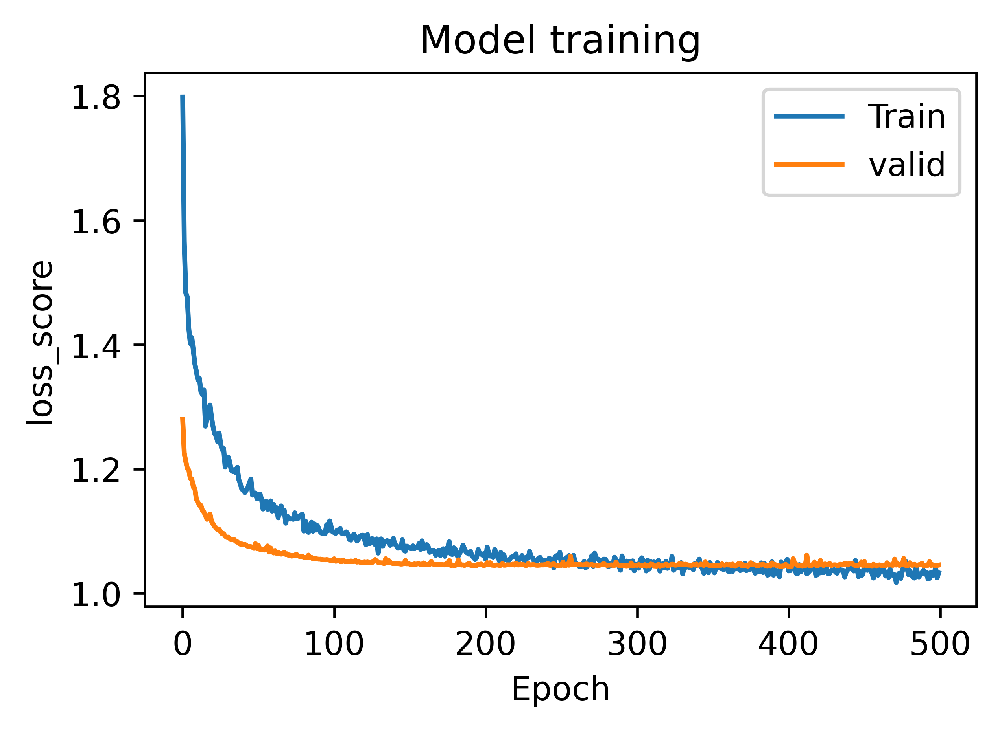

In [103]:
# Plot training & validation acc values
plt.figure(figsize=(10, 3))
plt.subplot(121)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model training')
plt.ylabel('loss_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'valid'], loc='upper right')
plt.show()

In [104]:
test_predictions = model.predict(test_X)
from scipy.stats import nbinom
n = test_predictions[:,0]; p = test_predictions[:,1]
y_pred = nbinom.mean(n,p)
test_dataset.obsm["predicted_gene"] = y_pred

/scratch/imb/Xiao/STimage/stimage/utils.py:106: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = plt.colorbar(plot, cax=fig.add_axes(


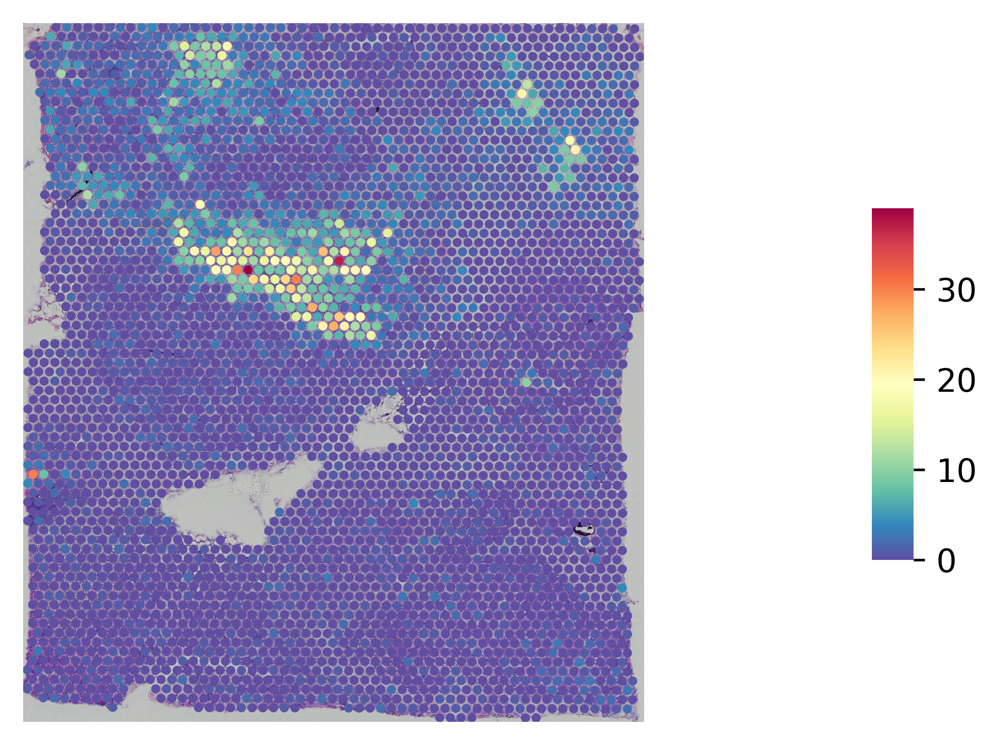

In [105]:
gene_plot(test_dataset, genes=gene, spot_size=8)

In [106]:
test_dataset_ = test_dataset[:,gene].copy()
test_dataset_.X = test_dataset_.obsm["predicted_gene"]

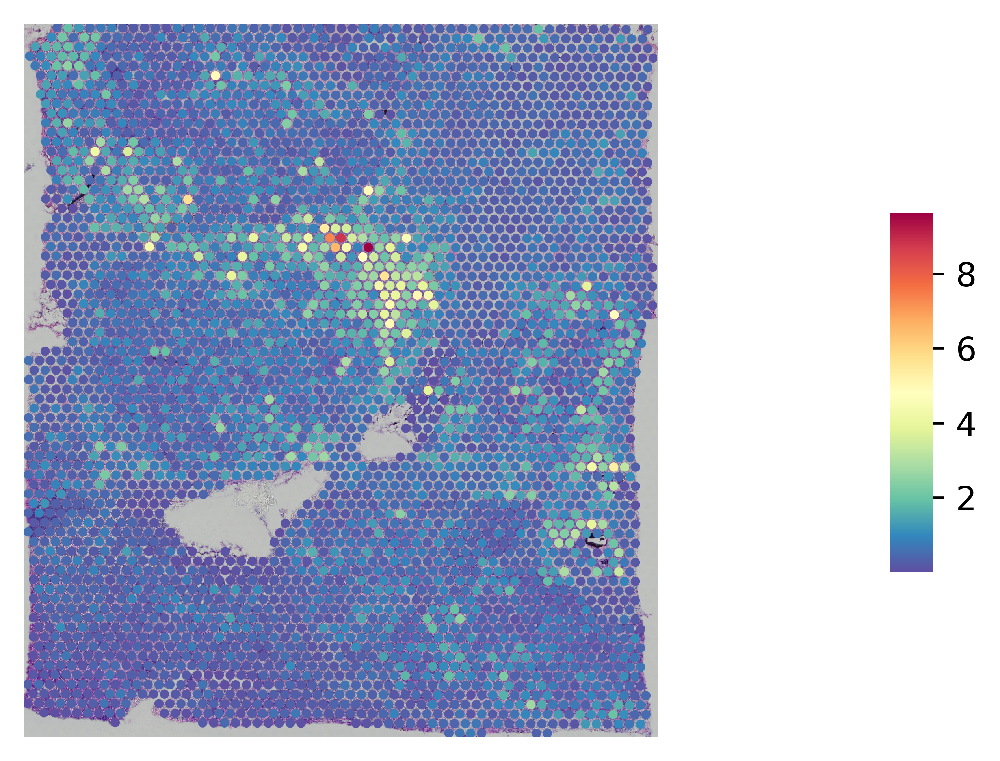

In [107]:
gene_plot(test_dataset_, genes=gene, spot_size=8)

In [108]:
import seaborn as sns
import matplotlib.pyplot as plt
test_Y_ = test_Y.copy()
test_Y_["pred"] = y_pred


In [109]:
from scipy import stats

r2 = stats.pearsonr(test_Y_.iloc[,0], 
                    test_Y_.iloc[,1],)[0] ** 2
sns.set_theme()
g = sns.lmplot(
    x=test_Y_.iloc[:,0], y=test_Y_.iloc[:,1],
    height=5, legend=True
)
# g.set(ylim=(0, 360), xlim=(0,360))

g.set_axis_labels("true", "pred")
plt.annotate(r'$R^2:{0:.2f}$'.format(r2),
            (max(test_Y_.iloc[:,0])*0.8, max(test_Y_.iloc[:,1])*0.8))

SyntaxError: invalid syntax (<ipython-input-109-b4129fce2a54>, line 3)